# Instacart Data Analysis

**Instacart** is the leading grocery technology company in North America, partnering with more than 1,400 national, regional, and local retail banners to deliver from more than 80,000 stores across more than 14,000 cities in North America.

The primary **objective of the ongoing analysis** is to delve into the Instacart sales data and craft every conceivable insight that can contribute to the further business growth.
<img src=https://www.retailtouchpoints.com/wp-content/uploads/2023/03/Instacart-Health-food-products-960x499.png>

### Import Statements

In [1]:
%pip install pymysql

Note: you may need to restart the kernel to use updated packages.


In [2]:
import pymysql
import json

import pandas as pd

import plotly.express as px
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns

### Connecting Jupyter Notebook to a MySQL database

In [3]:
# Load credentials from the JSON file
with open("credentials.json", "r") as file:
    creds = json.load(file)

# Connection parameters
host_name = creds["host_name"]
user_name = creds["user_name"]
user_password = creds["user_password"]
database_name = creds["database_name"]

# Establishing the connection
connection = pymysql.connect(
    host=host_name,
    user=user_name,
    password=user_password,
    db=database_name
)

# Check if you're connected
if connection.open:
    print("Connected to the database")
else:
    print("Failed to connect")

Connected to the database


### Notebook Representation

In [4]:
pd.options.display.float_format = '{:,.2f}'.format

## Data Preparation: Handle Data as a DataFrame

### Aisles

In [5]:
query_aisles = "SELECT * FROM aisles;"
df_aisles = pd.read_sql(query_aisles, connection)

df_aisles.head()

/Users/nadyavoynich/opt/anaconda3/lib/python3.9/site-packages/pandas/io/sql.py:762: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(


,aisle_id,aisle
0,1,prepared soups salads
1,2,specialty cheeses
2,3,energy granola bars
3,4,instant foods
4,5,marinades meat preparation


### Departments

In [6]:
query_departments = "SELECT * FROM departments;"
df_departments = pd.read_sql(query_departments, connection)

df_departments.head()

/Users/nadyavoynich/opt/anaconda3/lib/python3.9/site-packages/pandas/io/sql.py:762: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(


,department_id,department
0,1,frozen
1,2,other
2,3,bakery
3,4,produce
4,5,alcohol


### Products

In [7]:
query_products = "SELECT * FROM products;"
df_products = pd.read_sql(query_products, connection)

df_products.head()

/Users/nadyavoynich/opt/anaconda3/lib/python3.9/site-packages/pandas/io/sql.py:762: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(


,product_id,product_name,aisle_id,department_id
0,1,Chocolate Sandwich Cookies,61,19
1,2,All-Seasons Salt,104,13
2,3,Robust Golden Unsweetened Oolong Tea,94,7
3,4,Smart Ones Classic Favorites Mini Rigatoni Wit...,38,1
4,5,Green Chile Anytime Sauce,5,13


### Orders
**Note:** To expedite the data analysis process, the data is directly retrieved from CSV files.

In [8]:
df_orders = pd.read_csv('data/orders.csv')
df_orders.head()

,order_id,user_id,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order
0,2539329,1,prior,1,2,8,NaN
1,2398795,1,prior,2,3,7,15.00
2,473747,1,prior,3,3,12,21.00
3,2254736,1,prior,4,4,7,29.00
4,431534,1,prior,5,4,15,28.00


### Orders: Prior
**Note:** To expedite the data analysis process, the data is directly retrieved from CSV files.

In [9]:
df_orders_prior = pd.read_csv('data/order_products__prior.csv')
df_orders_prior.head()

,order_id,product_id,add_to_cart_order,reordered
0,2,33120,1,1
1,2,28985,2,1
2,2,9327,3,0
3,2,45918,4,1
4,2,30035,5,0


### Orders: Train
**Note:** To expedite the data analysis process, the data is directly retrieved from CSV files.

In [10]:
df_orders_train = pd.read_csv('data/order_products__train.csv')
df_orders_train.head()

,order_id,product_id,add_to_cart_order,reordered
0,1,49302,1,1
1,1,11109,2,1
2,1,10246,3,0
3,1,49683,4,0
4,1,43633,5,1


## Data Exploration

### Check for Missing Values and Duplicates

In [11]:
dataframes = [df_aisles, df_departments, df_products, df_orders, df_orders_prior, df_orders_train]

for df in dataframes:
    df_name = [name for name, obj in locals().items() if obj is df][0]
    print(f'{df_name} has duplicates: {df.duplicated().values.any()}')
    print(f'{df_name} has NaN values: {df.isna().values.any()}')

df_aisles has duplicates: False
df_aisles has NaN values: False
df_departments has duplicates: False
df_departments has NaN values: False
df_products has duplicates: False
df_products has NaN values: False
df_orders has duplicates: False
df_orders has NaN values: True
df_orders_prior has duplicates: False
df_orders_prior has NaN values: False
df_orders_train has duplicates: False
df_orders_train has NaN values: False


In [12]:
df_orders.isna().sum()

order_id                       0
user_id                        0
eval_set                       0
order_number                   0
order_dow                      0
order_hour_of_day              0
days_since_prior_order    206209
dtype: int64

* No duplicates.
* The only column with NaN values is 'days_since_prior_order' in the 'prior' evaluation set. In this case NaN means this was the first order.
* Data type in each data frame was checked in the Preliminary Data Exploration notebook -> no issues.

### Understanding the dataset

In [13]:
# Number of orders
df_orders.info()
print(f'The dataset has {df_orders.shape[0]} rows and {df_orders.shape[1]} columns.')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3421083 entries, 0 to 3421082
Data columns (total 7 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   order_id                int64  
 1   user_id                 int64  
 2   eval_set                object 
 3   order_number            int64  
 4   order_dow               int64  
 5   order_hour_of_day       int64  
 6   days_since_prior_order  float64
dtypes: float64(1), int64(5), object(1)
memory usage: 182.7+ MB
The dataset has 3421083 rows and 7 columns.


In [14]:
df_orders.head()

,order_id,user_id,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order
0,2539329,1,prior,1,2,8,NaN
1,2398795,1,prior,2,3,7,15.00
2,473747,1,prior,3,3,12,21.00
3,2254736,1,prior,4,4,7,29.00
4,431534,1,prior,5,4,15,28.00


In [15]:
df_orders.groupby('eval_set').count()

,order_id,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order
eval_set,,,,,,
prior,3214874,3214874,3214874,3214874,3214874,3008665
test,75000,75000,75000,75000,75000,75000
train,131209,131209,131209,131209,131209,131209


In [16]:
# User count and their order frequency
df_orders.groupby('user_id').count().sort_values('order_id', ascending=False)

,order_id,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order
user_id,,,,,,
152340,100,100,100,100,100,99
185641,100,100,100,100,100,99
185524,100,100,100,100,100,99
81678,100,100,100,100,100,99
70922,100,100,100,100,100,99
...,...,...,...,...,...,...
13046,4,4,4,4,4,3
70208,4,4,4,4,4,3
111440,4,4,4,4,4,3


### Notes about the dataset
* The dataset is anonymized and contains a sample of over 3 million grocery orders from more than 200,000 Instacart users.
* For each user, between 4 and 100 of their orders are provided, with the sequence of products purchased in each order. 
* Each entity (customer, product, order, aisle, etc.) has an associated unique id. Most of the files and variable names should be self-explanatory.
* **'order_dow'** is the day of week the order was placed.
* **'order_hour_of_day'** is the hour of day the order was placed.
* **'days_since_prior_order'** is the relative measure of time between orders.
* **'reordered'** indicates that the customer has a previous order that contains the product. Note that some orders will have no reordered items.

# Data Cleaning
In accordance with the data exploration results (no duplicates, no unexpected NaN values, no issues with a data type), there is no need in data cleaning.

# Data Analytics

**Main questions to answer:**

- How many orders are made at different hours of the day?
- How many orders are made at different days of the week?
- After how many days to people order again?
- How many items do people buy? (show distribution graph)
- What are the best selling items? (show distribution graph)
- What items are most frequently re-ordered? (show distribution graph)
- Which items are part into a card first? second? third?
- How often are products from the department/aisle sold? (by department + product, and the size of each “box” should show the number of sales)

## How many orders are made at different hours of the day?

In [17]:
orders_per_hour = df_orders.order_hour_of_day.value_counts()

hours_bar = px.bar(x=orders_per_hour.index,
                   y=orders_per_hour.values,
                   title='Number of Orders Across Various Times of Day',
                   color_discrete_sequence=px.colors.qualitative.T10,
                  )

hours_bar.update_layout(xaxis_title='Hour of Day',
                        yaxis_title='Number of Orders',
                       )

hours_bar.show()

Order volumes reach their peak between 10 a.m. and 4 p.m.

## How many orders are made at different days of the week?

In [18]:
orders_per_day = df_orders.order_dow.value_counts()

days_bar = px.bar(x=orders_per_day.index,
                  y=orders_per_day.values,
                  title='Number of Orders Across Various Days of Week',
                  text_auto='.2s',
                  color_discrete_sequence=px.colors.qualitative.T10,
                 )

days_bar.update_layout(xaxis_title='Day of Week',
                       yaxis_title='Number of Orders',
                      )
days_bar.show()

'0' and '1' days are the most popular days for shopping by users.

## After how many days to people order again?

In [19]:
df_orders.days_since_prior_order.describe()

count   3,214,874.00
mean           11.11
std             9.21
min             0.00
25%             4.00
50%             7.00
75%            15.00
max            30.00
Name: days_since_prior_order, dtype: float64

* On average (median) people order again in 7 days and maximum after 30 days from the last order.
* The minimum value is 0 (indicating NaN values), signifying an absence of order history.

##### How many users in the dataset placed their initial order?

In [20]:
new_users = df_orders.isna().days_since_prior_order.sum()
nu_share = new_users / df_orders.days_since_prior_order.count() * 100
print(f'There are {new_users} new users. Initial orders are {nu_share:.2}% of all orders.')

There are 206209 new users. Initial orders are 6.4% of all orders.


It appears that this dataset portrays sales data from the launch of the Instacart business, wherein the user count precisely matches the total user count of 206,209.

In [21]:
df_orders[df_orders.user_id == 47980]

,order_id,user_id,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order
797905,1828333,47980,prior,1,1,22,NaN
797906,730477,47980,prior,2,0,21,30.00
797907,94332,47980,prior,3,4,15,18.00
797908,2177926,47980,test,4,2,20,30.00


Randomly chosen user is represented in train and prior dataset, but not represented in the train dataset. **Why?**

* In the orders table, "train" and "test" identify the last order for every user, and are randomly split between train and test. They are "future data", but only on a per-user basis (e.g., the last order for user X might be earlier than the first order for user Y).
* The data in the orders table should be used for every order. For example, you can use the day of week, time of day, days since last order, for every order you are making predictions for in the test set. The only data you do not have for the test set of orders is the products that were ordered. There is a order_products__test that is being used to compute the leaderboard scores.

### Merging dataframes for further analysis

In [22]:
prior_train_orders = pd.concat([df_orders_prior, df_orders_train], ignore_index=True)
orders_products1 = pd.merge(prior_train_orders, df_products, on='product_id')
orders_products2 = pd.merge(orders_products1, df_aisles, on='aisle_id')
orders_products_df = pd.merge(orders_products2, df_departments, on='department_id')
orders_products_df[:7]

,order_id,product_id,add_to_cart_order,reordered,product_name,aisle_id,department_id,aisle,department
0,2,33120,1,1,Organic Egg Whites,86,16,eggs,dairy eggs
1,26,33120,5,0,Organic Egg Whites,86,16,eggs,dairy eggs
2,120,33120,13,0,Organic Egg Whites,86,16,eggs,dairy eggs
3,327,33120,5,1,Organic Egg Whites,86,16,eggs,dairy eggs
4,390,33120,28,1,Organic Egg Whites,86,16,eggs,dairy eggs
5,537,33120,2,1,Organic Egg Whites,86,16,eggs,dairy eggs
6,582,33120,7,1,Organic Egg Whites,86,16,eggs,dairy eggs


In [23]:
orders_products_df.shape

(33819106, 9)

Users bought almost 34 million products on the platform!\
\
**Note:** 75,000 orders from the test set are not taken into account, because there is no data about the products that were ordered in these orders. Thus, sales might be over 34 million products.

## How many items do people buy?

In [24]:
# Calculating the number of products per order
products_in_order = orders_products_df.groupby('order_id').agg({'product_id': pd.Series.count})
products_in_order.rename(columns={'product_id':'products_count'}, inplace=True)
products_in_order[:3]

,products_count
order_id,
1,8
2,9
3,8


In [25]:
products_in_order.describe()

,products_count
count,"3,346,083.00"
mean,10.11
std,7.54
min,1.00
25%,5.00
50%,8.00
75%,14.00
max,145.00


* On average (median) people buy 8 products per order.
* They buy at least 1 product, and maximum 145 products.
* 75% of the orders has less than 14 products per order. This means the order with 145 products might be an outlier. Further investigation is needed.

## What are the best selling items?

In [26]:
products_count = orders_products_df.groupby('product_id').agg({'product_name': pd.Series.count})
products_count.rename(columns={'product_name':'product_count'}, inplace=True)

products_sold = pd.merge(products_count, df_products, on='product_id')
products_ranged = products_sold.sort_values('product_count', ascending=False)
top_products = products_ranged[:20]
top_products = top_products.sort_values('product_count', ascending=True)

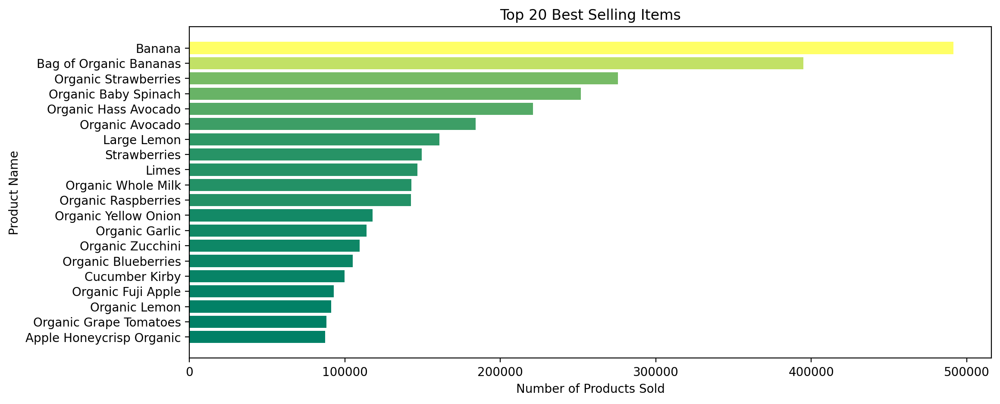

In [27]:
plt.figure(figsize=(12,5), dpi=200)

# Normalize the data and apply colormap
norm = plt.Normalize(min(top_products.product_count), max(top_products.product_count))
colors = cm.summer(norm(top_products.product_count))

plt.barh(top_products.product_name,
         top_products.product_count,
         color=colors)

plt.title('Top 20 Best Selling Items')
plt.ylabel('Product Name')
plt.xlabel('Number of Products Sold')

plt.show()

## What items are most frequently re-ordered?

In many cases, businesses use inventory management systems to track the availability of products and trigger reorder purchases automatically when stock levels fall below a certain threshold. This helps maintain a smooth supply chain and prevents interruptions in the availability of products or materials.

In [28]:
reordered_prods = orders_products_df.groupby('product_name').agg({'reordered': pd.Series.sum})
reordered_prods = reordered_prods[reordered_prods.reordered > 0].sort_values('reordered', ascending=False)
reordered_prods[:3]

,reordered
product_name,
Banana,415166
Bag of Organic Bananas,329275
Organic Strawberries,214448


In [29]:
top_reordered = reordered_prods[:20]
top_reordered = top_reordered.sort_values('reordered', ascending=True)

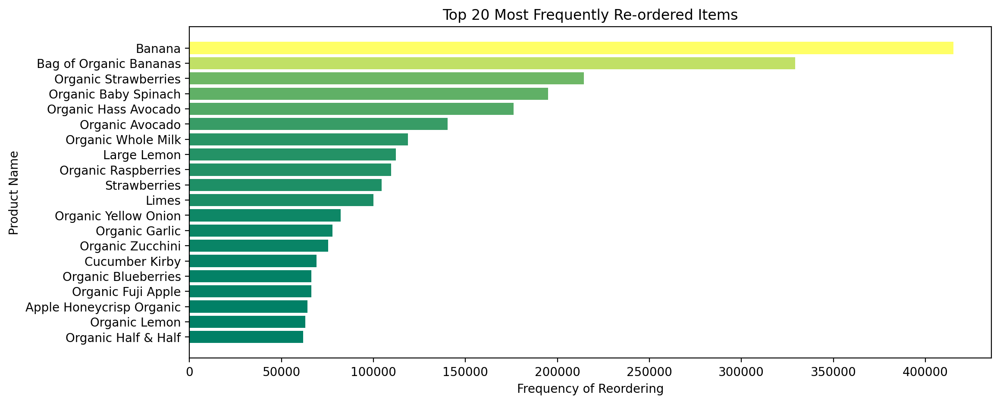

In [30]:
plt.figure(figsize=(12,5), dpi=200)

# Normalize the data and apply colormap
norm = plt.Normalize(min(top_reordered.reordered), max(top_reordered.reordered))
colors = cm.summer(norm(top_reordered.reordered))

plt.barh(top_reordered.index,
         top_reordered.reordered,
         color=colors)

plt.title('Top 20 Most Frequently Re-ordered Items')
plt.ylabel('Product Name')
plt.xlabel('Frequency of Reordering')

plt.show()

## Which items are part into a cart first? second? third?

##### 1. Creating DataFrames containing the top 20 products ordered in the first queue

In [31]:
# Items which are part into a cart firstly
df_ordered_first = orders_products_df[orders_products_df.add_to_cart_order == 1]
order_1 = df_ordered_first.groupby('product_name').agg({'add_to_cart_order': pd.Series.count}).sort_values('add_to_cart_order', ascending=False)
top_order_1 = order_1[:20]
top_order_1 = top_order_1.sort_values('add_to_cart_order', ascending=True)
top_order_1[:3] # check the DataFrame

,add_to_cart_order
product_name,
Raspberries,9320
Organic Reduced Fat 2% Milk,9644
Half & Half,9847


In [33]:
# Items which are part into a cart secondly
df_ordered_second = orders_products_df[orders_products_df.add_to_cart_order == 2]
order_2 = df_ordered_second.groupby('product_name').agg({'add_to_cart_order': pd.Series.count}).sort_values('add_to_cart_order', ascending=False)
top_order_2 = order_2[:20]
top_order_2 = top_order_2.sort_values('add_to_cart_order', ascending=True)
top_order_2[:3] # check the DataFrame

,add_to_cart_order
product_name,
Raspberries,9237
Half & Half,9510
Organic Yellow Onion,9780


In [57]:
# Items which are part into a cart thirdly
df_ordered_third = orders_products_df[orders_products_df.add_to_cart_order == 3]
order_3 = df_ordered_third.groupby('product_name').agg({'add_to_cart_order': pd.Series.count}).sort_values('add_to_cart_order', ascending=False)
top_order_3 = order_3[:20]
top_order_3 = top_order_3.sort_values('add_to_cart_order', ascending=True)
top_order_3[:3] # check the DataFrame

,add_to_cart_order
product_name,
Apple Honeycrisp Organic,8422
Sparkling Water Grapefruit,8615
Honeycrisp Apple,8712


##### 2. Merging 3 DFs while ensuring no products are not lost

In [56]:
# Rename columns to identify the source DataFrame
top_order_1['Firstly'] = top_order_1['add_to_cart_order']
top_order_2['Secondly'] = top_order_2['add_to_cart_order']
top_order_3['Thirdly'] = top_order_3['add_to_cart_order']

# Merge the DataFrames using outer join
top_prods_123 = pd.merge(top_order_1, top_order_2, how='outer', on='product_name')
top_prods_123 = pd.merge(top_prods_123, top_order_3, how='outer', on='product_name')

# Fill NaN values with 0
top_prods_123 = top_prods_123.fillna(0)

# Drop the original columns
top_prods_123 = top_prods_123.drop(['add_to_cart_order', 'add_to_cart_order_x', 'add_to_cart_order_y'], axis=1)

In [45]:
# Create a copy of the merged DataFrame and sort it by the total units sold
sorted_top_prods = top_prods_123.copy()
sorted_top_prods['Total'] = sorted_top_prods['Firstly'] + sorted_top_prods['Secondly'] + sorted_top_prods['Thirdly']
sorted_top_prods = sorted_top_prods.sort_values(by='Total', ascending=True)

##### 3. Visualisation of the merged DataFrame

In [73]:
bar_split = px.bar(sorted_top_prods,
                   x=['Firstly', 'Secondly', 'Thirdly'],
                   y=sorted_top_prods.index,
                   labels={'value': 'Units Sold', 'product_name': 'Product', 'variable': 'Added to cart:'},
                   title='Products Added to Cart Initially, Subsequently, and Thirdly',
                   color_discrete_sequence=px.colors.qualitative.T10,
                  )

bar_split.update_layout(yaxis_tickfont=dict(size=10),
                        title_font=dict(size=20),
                       )
bar_split.show()

## How often are products from the department/aisle sold?

In [60]:
products_with_dept = pd.merge(products_sold, df_departments, on='department_id')
depts_ranged = products_with_dept.groupby('department').agg({'product_count': pd.Series.sum}).sort_values('product_count',
                                                                                                          ascending=False)
depts_ranged[:3]

,product_count
department,
produce,9888378
dairy eggs,5631067
snacks,3006412


In [61]:
donut = px.pie(depts_ranged,
               names=depts_ranged.index,
               values='product_count',
               title='Orders by Department',
               hole=0.5,
               color_discrete_sequence=px.colors.qualitative.T10,
              )

donut.show()

In [64]:
prod_aisle_dept = pd.merge(products_with_dept, df_aisles, on='aisle_id')
prod_aisle_dept[:3] # check the DataFrame

,product_id,product_count,product_name,aisle_id,department_id,department,aisle
0,1,1928,Chocolate Sandwich Cookies,61,19,snacks,cookies cakes
1,78,12,Nutter Butter Cookie Bites Go-Pak,61,19,snacks,cookies cakes
2,102,190,Danish Butter Cookies,61,19,snacks,cookies cakes


In [67]:
fig = px.treemap(prod_aisle_dept, path=['department', 'aisle', 'product_name'], values='product_count',
                 color_discrete_sequence=px.colors.qualitative.T10,
                )

fig.update_layout(title='Interactive Tree Map: Department -> Aisle -> Product')

fig.show()

## Which aisles are more likely to be reordered from?

In [75]:
orders_products_df.head()

,order_id,product_id,add_to_cart_order,reordered,product_name,aisle_id,department_id,aisle,department
0,2,33120,1,1,Organic Egg Whites,86,16,eggs,dairy eggs
1,26,33120,5,0,Organic Egg Whites,86,16,eggs,dairy eggs
2,120,33120,13,0,Organic Egg Whites,86,16,eggs,dairy eggs
3,327,33120,5,1,Organic Egg Whites,86,16,eggs,dairy eggs
4,390,33120,28,1,Organic Egg Whites,86,16,eggs,dairy eggs


In [93]:
# Calculate total purchases
total_aisle = orders_products_df.groupby('aisle')['reordered'].count().reset_index()
total_aisle.rename(columns={'reordered': 'total_purchases'}, inplace=True)

# Calculate purchases with reordered products
reodered_aisle = orders_products_df.groupby('aisle')['reordered'].sum().reset_index()

# Create the DataFrame with 'reordered' and 'total_purchases' columns
merged_aisle = pd.merge(total_aisle, reodered_aisle, on='aisle')
merged_aisle['percent_reorder'] = (merged_aisle.reordered / merged_aisle.total_purchases) * 100
merged_aisle.head()

,aisle,total_purchases,reordered,percent_reorder
0,air fresheners candles,20918,6500,31.07
1,asian foods,173614,60986,35.13
2,baby accessories,8466,4669,55.15
3,baby bath body care,8909,2626,29.48
4,baby food formula,395654,233042,58.90


In [99]:
df_deps = orders_products_df[['aisle', 'department']].drop_duplicates()

# Merge the DataFrames using a left merge
dept_aisle_df = merged_aisle.merge(df_deps[['aisle', 'department']], on='aisle', how='left')
dept_aisle_df.head()

,aisle,total_purchases,reordered,percent_reorder,department
0,air fresheners candles,20918,6500,31.07,household
1,asian foods,173614,60986,35.13,international
2,baby accessories,8466,4669,55.15,babies
3,baby bath body care,8909,2626,29.48,babies
4,baby food formula,395654,233042,58.90,babies


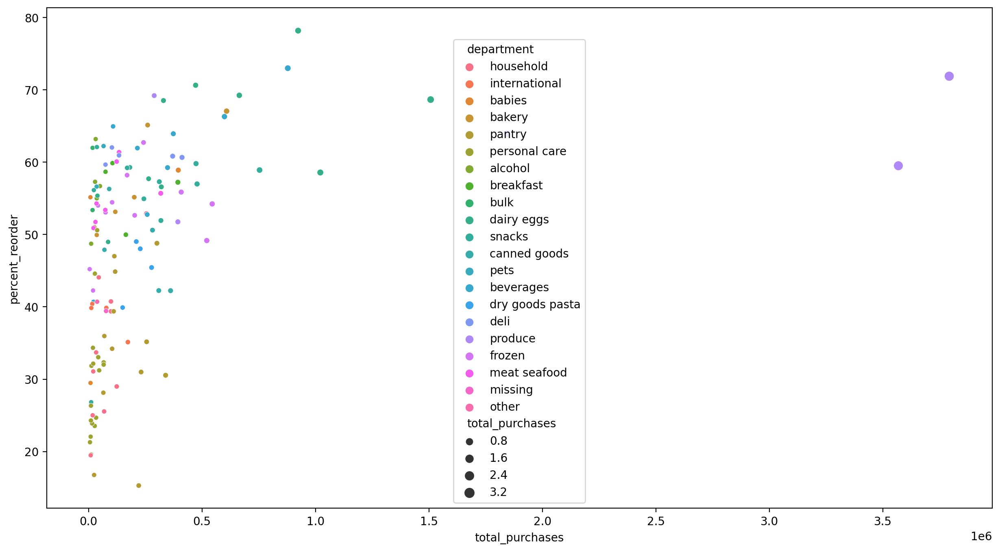

In [106]:
plt.figure(figsize=(15,8), dpi=200)
ax = sns.scatterplot(data=dept_aisle_df,
                     x='total_purchases',
                     y='percent_reorder',
                     hue='department', #color
                     size='total_purchases', # bubble size
                    )

plt.show()

In [76]:
merged_df = pd.merge(orders_products_df, df_orders, on='order_id')

,order_id,product_id,add_to_cart_order,reordered,product_name,aisle_id,department_id,aisle,department,user_id,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order
0,2,33120,1,1,Organic Egg Whites,86,16,eggs,dairy eggs,202279,prior,3,5,9,8.00
1,2,28985,2,1,Michigan Organic Kale,83,4,fresh vegetables,produce,202279,prior,3,5,9,8.00
2,2,17794,6,1,Carrots,83,4,fresh vegetables,produce,202279,prior,3,5,9,8.00


# Summary

### Closing the database connection to free up resources

In [ ]:
#connection.close()